In [3]:
import numpy as np
import mne
from mne.datasets import sample
import numpy as np

import mne
mne.set_log_level(verbose='CRITICAL')
from mne.datasets import multimodal
from mne import channels, evoked, create_info
import matplotlib.pyplot as plt

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import scipy.signal as sl
from typing import Optional
import scipy as sp
import sys
from nilearn import plotting
sys.path.insert(1, os.path.realpath(os.path.pardir))
from deepmeg.data.datasets import EpochsDataset, read_epochs_dataset
from torch.utils.data import DataLoader
from deepmeg.preprocessing.transforms import zscore
import torch
from collections import defaultdict
import torchmetrics
from deepmeg.training.callbacks import Callback, EarlyStopping, L2Reg, PrintingCallback
from deepmeg.interpreters import SPIRITInterpreter
import random


ImportError: cannot import name 'SPIRIT' from 'deepmeg.models.interpretable' (/home/user/Projects/deepmeg/deepmeg/models/interpretable.py)

In [2]:
import deepmeg

In [2]:
import torch.nn as nn
import torch.nn.init as init
import math
import torch

from deepmeg.models import BaseModel

class Fourier(nn.Module):
    def __init__(self, n_points, n_components):
        super().__init__()
        self.n_points = n_points
        self.n_components = n_components
        self.a = nn.Parameter(torch.empty(self.n_points, self.n_components, 1))
        self.b = nn.Parameter(torch.empty(self.n_points, self.n_components, 1))

        self.a0 = nn.Parameter(torch.empty(1))


        self.reset_parameters()

    def reset_parameters(self) -> None:
        init.uniform_(self.a, -0.01, 0.01)
        init.uniform_(self.b, -0.01, 0.01)
        init.uniform_(self.a0, -0.01, 0.01)

    def forward(self, x):
        out = self.a0/(2*self.n_points)*torch.ones_like(x)
        for n in range(self.n_components):
            out += (x@self.a[:, n])*torch.cos((2*np.pi*x*n)/self.n_points) + (x@self.b[:, n])*torch.sin((2*np.pi*x*n)/self.n_points)

        return out


class FourierNet(BaseModel):

    def __init__(self, n_points, n_components=None):
        super().__init__()

        if n_components is None:
            n_components = n_points//2

        self.layer = Fourier(n_points, n_components)
        self.bn = nn.BatchNorm1d(n_points)

    def forward(self, x):
        x = self.bn(x)
        x = self.layer(x)
        return x

from deepmeg.convtools import compute_output_shape, conviter

class AutoCov1D(nn.Module):
    def __init__(self, out_channels, window_size, latent_dim = None, overlap=0, stride=1, padding=0, bias=True):
        super().__init__()
        self.window_size = window_size
        self.latent_dim = latent_dim if latent_dim is not None else window_size // 2
        self.overlap = overlap
        self.stride = stride
        self.padding = padding
        # self.weight = nn.Parameter(torch.empty(self.window_size, self.latent_dim, out_channels))
        self.transform = nn.ModuleList([FourierNet(self.window_size) for _ in range(out_channels)])
        self.transform2 = nn.ModuleList([FourierNet(self.window_size) for _ in range(out_channels)])

        if bias:
            self.bias = nn.Parameter(torch.empty(out_channels))
        else:
            self.register_parameter('bias', None)

        self.reset_parameters()

    def reset_parameters(self) -> None:
        # init.uniform_(self.weight, -0.01, 0.01)
        if self.bias is not None:
            init.uniform_(self.bias, -0.01, 0.01)

    def forward(self, X):
        # inputs shape (N_batch, width) ~ (N_batch, n_times)
        X_part1 = X[:, :-(self.window_size - self.overlap)] # shape: (batches, times)
        X_part2 = X[:, self.window_size - self.overlap:,]

        assert X_part1.shape == X_part2.shape, f'Windowed sequence is corrupted: {X_part1.shape} vs {X_part2.shape}'

        convargs = ((X_part1.shape[1], X_part1.shape[0]), self.window_size, self.padding, self.stride)
        n_windows = compute_output_shape(*convargs)[0]
        out_tensor = torch.zeros(X.shape[0], n_windows, len(self.transform)) # ~ batches x n_windows x out_channels

        # iter over neurons
        for n_neuron in range(len(self.transform)):
            for p, q, k in conviter(*convargs):
                # p shape: n_times, ...
                # q shape: n_windows, 0
                # k shape: window_size, ...
                pad_params = list()

                time_range = p[0]
                window_range = k[0]
                n_window = q[0]

                if window_range.start is not None and abs(window_range.start) < self.window_size:
                    pad_params.append(abs(window_range.start))
                else:
                    pad_params.append(0)
                if window_range.stop is not None and abs(window_range.stop) < self.window_size:
                    pad_params.append(abs(window_range.stop))
                else:
                    pad_params.append(0)

                window1 = X_part1[:, time_range]
                window2 = X_part2[:, time_range]

                if pad_params != [0, 0]:
                    window1 = nn.functional.pad(window1, pad_params)
                    window2 = nn.functional.pad(window2, pad_params)

                # weight = self.weight[window_range, :, n_neuron]

                # proj1 = torch.matmul(window1, weight) # (N batch x time_range) @ (window_range x latent_dim x n_neuron) = (N batch x latent_dim)
                # proj2 = torch.matmul(window2, weight)
                proj1 = self.transform[n_neuron](window1)
                proj2 = self.transform2[n_neuron](window2)

                cov = torch.mean(
                    (proj1 - torch.mean(proj1, 1, keepdim=True))*
                    (proj2 - torch.mean(proj2, 1, keepdim=True)),
                    1,
                    keepdim=True
                ) # ~ (N_batch, 1)
                out_tensor[:, n_window, n_neuron] = torch.squeeze(cov, -1) + self.bias[n_neuron] if self.bias is not None else torch.squeeze(cov, -1)

        return out_tensor

# X = torch.rand(100, 204)
# AutoCov1D(1, 20, 20, 0, 20, 10)(X)


class SPIRIT(BaseModel):
    def __init__(
        self,
        n_channels: int,
        n_latent: int,
        n_times: int,
        filter_size: int,
        window_size: int,
        latent_dim: int,
        pool_factor: int,
        n_outputs: int
    ):
        super().__init__()
        self.unmixing_layer = nn.Conv1d(n_channels, n_latent, kernel_size=1, bias=True)
        self.temp_conv = nn.Conv1d(n_latent, n_latent, kernel_size=filter_size, bias=True, groups=n_latent, padding='same')
        self.timesel_list = nn.ModuleList([
            nn.Sequential(
                AutoCov1D(1, window_size, latent_dim, 0, window_size, bias=True),
            )
            for _ in range(n_latent)
        ])
        self.expander = nn.Conv1d(
            in_channels=8,
            out_channels=8,
            kernel_size=(2,),
            padding=1
        )
        self.windows = [win for win, _, _ in conviter((n_times-(window_size),), window_size, 0, window_size)]
        self.windows.append(slice(self.windows[-1].start + window_size, None))
        self.timecomp_list = nn.ModuleList([
            nn.Sequential(
                nn.Linear(
                    n_times,
                    (n_times//pool_factor),
                    bias=False
                ),
                nn.Dropout(.25),
                torch.nn.Sigmoid()
            )
            for i in range(n_latent)
        ])
        final_out_features = (n_times//pool_factor)*n_latent
        self.fc_layer = nn.Linear(final_out_features, n_outputs)


    def forward(self, x: torch.Tensor):
        x = self.unmixing_layer(x)
        x = self.temp_conv(x)
        x_est = torch.stack(
            [
                timesel(x[:, i, :]) for i, timesel in enumerate(self.timesel_list)
            ],
            1
        )

        x_est = torch.squeeze(x_est, -1)
        x_est = self.expander(x_est)

        x_out = list()
        for i, window in enumerate(self.windows):
            x_out.append(
                x[:, :, window]
                *torch.unsqueeze(x_est[:, :, i], -1)
            )

        x = torch.cat(x_out, -1)

        x = torch.stack(
            [
                timesel(x[:, i, :]) for i, timesel in enumerate(self.timecomp_list)
            ],
            1
        )
        x = torch.flatten(x, 1)
        return self.fc_layer(x)


# SPIRIT(
#     **model_kwargs
# )(X)

In [3]:
def generate_activations(
    event_names, roi_labels, n_rois=1
):
    start = 0
    random.shuffle(roi_labels)
    activations = dict()

    for event in event_names:
        n_rois_sel = int(np.random.randint(1, n_rois+1))
        sel_rois = roi_labels[start:start+n_rois_sel]
        activations[event] = [(sel_roi.name, int(np.random.randint(10, 100))) for sel_roi in sel_rois]
        start += n_rois_sel

        if start >= len(roi_labels):
            break

    return activations


def plot_roi(roi_labels, subject, subjects_dir, colors=None, marker_sizes=None):
    coords = list()
    for roi_label in roi_labels:
        if roi_label.name[-2:] == 'lh':
            hemi = 0
        elif roi_label.name[-2:] == 'rh':
            hemi = 1
        else: raise ValueError(f'Hemisphere undefined: {roi_label.name}')

        coords.append(
            mne.vertex_to_mni(
                roi_label.center_of_mass(
                    subject,
                    subjects_dir=subjects_dir
                ),
                hemi,
                subject,
                subjects_dir=subjects_dir
            )
        )
    if isinstance(colors, str):
        colors = [colors for _ in coords]
    view = plotting.view_markers(
        coords, colors,
        marker_size=marker_sizes
    )
    return view


def data_fun(times, latency, duration, rng=None, f = 15):
    """Function to generate source time courses for evoked responses,
    parametrized by latency and duration."""
    if not rng:
        rng = np.random.RandomState(7)
    sigma = 0.375 * duration
    sinusoid = np.sin(2 * np.pi * f * (times - latency))
    gf = np.exp(- (times - latency - (sigma / 4.) * rng.rand(1)) ** 2 /
                (2 * (sigma ** 2)))
    return 1e-9 * sinusoid * gf


# very simple function to plot history of the model training

def plot_metrics(metrics: dict[str, np.ndarray]):
    plot_dict = defaultdict(dict)

    for metric, values in metrics.items():
        metric_data = metric.split('_')
        metric_name = '_'.join(metric_data[:-1])
        metric_kind = metric_data[-1]
        plot_dict[metric_name][metric_kind] = values

    for metric_name, kind_dict in plot_dict.items():
        legend = list()
        for metric_kind, kind in kind_dict.items():
            plt.plot(kind)
            legend.append(metric_kind)
        plt.title(metric_name)
        plt.legend(legend)
        plt.show()

In [3]:
from collections import namedtuple

EventConfig = namedtuple('EventConfig', 'start duration id')


def create_events(*configs: EventConfig, duration, sfreq):
    n_points = int(duration*sfreq)
    all_events = list()
    for config in configs:
        currect_timepoint = int(config.start*sfreq)
        events = list()
        while currect_timepoint < n_points:
            events.append([currect_timepoint, 0, config.id])
            currect_timepoint += int(config.duration*sfreq)
        all_events += events
    all_events = np.array(all_events)
    return all_events[np.argsort(all_events[:, 0])]


In [4]:
data_path = sample.data_path()
subjects_dir = data_path / 'subjects'
subject = 'sample'
meg_path = data_path / 'MEG' / subject
fname_info = meg_path / 'sample_audvis_raw.fif'
info_orig = mne.io.read_info(fname_info)
tstep = 1 / info_orig['sfreq']
fwd_fname = meg_path / 'sample_audvis-meg-eeg-oct-6-fwd.fif'
fwd = mne.read_forward_solution(fwd_fname)
src = fwd['src']
fname_event = meg_path / 'sample_audvis_raw-eve.fif'
fname_cov = meg_path / 'sample_audvis-cov.fif'

events = mne.read_events(fname_event)

# events = create_events(
#     EventConfig(10.6, 1.25, 1),
#     EventConfig(11.2, 1.5, 2),
#     EventConfig(12.0, 1., 3),
#     EventConfig(11.8, 1., 4),
#     EventConfig(11.2, 1.25, 4),
#     EventConfig(10.4, 1.5, 4),
#     duration=200,
#     sfreq=info_orig['sfreq']
# )

noise_cov = mne.read_cov(fname_cov)

event_id = {'e1': 1, 'e2': 2, 'e3': 3,
            'e4': 4, 'e5': 5, 'e6': 32}

all_labels = mne.read_labels_from_annot('sample', parc='aparc.a2009s', subjects_dir=subjects_dir)
label_by_name = {label.name: label for label in all_labels}


In [17]:
activations = generate_activations(
    event_id.keys(),
    all_labels,
    4
)
labels = list()
marker_sizes = list()
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'violet']
all_colors = list()
for color, (event_name, activation) in zip(colors, activations.items()):
    for a in activation:
        labels.append(label_by_name[a[0]])
        marker_sizes.append(a[1])
        all_colors.append(color)

plot_roi(labels, 'sample', subjects_dir, all_colors, marker_sizes)

In [5]:
activations

{'e1': [('G_parietal_sup-rh', 48)],
 'e2': [('G_pariet_inf-Angular-lh', 18), ('S_orbital_med-olfact-rh', 37)],
 'e3': [('G_cuneus-rh', 93), ('S_front_inf-rh', 27)],
 'e4': [('G_and_S_occipital_inf-lh', 25),
  ('G_occipital_middle-lh', 54),
  ('S_oc-temp_med_and_Lingual-lh', 40)],
 'e5': [('S_intrapariet_and_P_trans-rh', 49), ('S_postcentral-rh', 60)],
 'e6': [('G_postcentral-rh', 69)]}

In [ ]:
{
    'e1': [
        ('G_and_S_cingul-Mid-Ant-rh', 41),
        ('S_oc_middle_and_Lunatus-rh', 53),
        ('S_orbital-H_Shaped-rh', 85),
        ('S_intrapariet_and_P_trans-rh', 17)
    ],
    'e2': [
        ('S_temporal_sup-lh', 37),
        ('S_orbital_lateral-lh', 99),
        ('G_front_middle-lh', 57)
    ],
    'e3': [('S_temporal_inf-rh', 78), ('G_orbital-rh', 70)],
    'e4': [('S_pericallosal-rh', 30), ('S_calcarine-rh', 43)],
    'e5': [('G_front_inf-Opercular-rh', 22), ('S_circular_insula_sup-lh', 23)],
    'e6': [('S_circular_insula_sup-rh', 58), ('G_cuneus-lh', 23)]
}

In [137]:
label_by_name.keys()

dict_keys(['G_Ins_lg_and_S_cent_ins-lh', 'G_Ins_lg_and_S_cent_ins-rh', 'G_and_S_cingul-Ant-lh', 'G_and_S_cingul-Ant-rh', 'G_and_S_cingul-Mid-Ant-lh', 'G_and_S_cingul-Mid-Ant-rh', 'G_and_S_cingul-Mid-Post-lh', 'G_and_S_cingul-Mid-Post-rh', 'G_and_S_frontomargin-lh', 'G_and_S_frontomargin-rh', 'G_and_S_occipital_inf-lh', 'G_and_S_occipital_inf-rh', 'G_and_S_paracentral-lh', 'G_and_S_paracentral-rh', 'G_and_S_subcentral-lh', 'G_and_S_subcentral-rh', 'G_and_S_transv_frontopol-lh', 'G_and_S_transv_frontopol-rh', 'G_cingul-Post-dorsal-lh', 'G_cingul-Post-dorsal-rh', 'G_cingul-Post-ventral-lh', 'G_cingul-Post-ventral-rh', 'G_cuneus-lh', 'G_cuneus-rh', 'G_front_inf-Opercular-lh', 'G_front_inf-Opercular-rh', 'G_front_inf-Orbital-lh', 'G_front_inf-Orbital-rh', 'G_front_inf-Triangul-lh', 'G_front_inf-Triangul-rh', 'G_front_middle-lh', 'G_front_middle-rh', 'G_front_sup-lh', 'G_front_sup-rh', 'G_insular_short-lh', 'G_insular_short-rh', 'G_oc-temp_lat-fusifor-lh', 'G_oc-temp_lat-fusifor-rh', 'G_oc-t

In [5]:
activations = {
    'e1': [
        ('S_interm_prim-Jensen-rh', 41),
        ('S_intrapariet_and_P_trans-rh', 17)
        # ('S_oc_middle_and_Lunatus-rh', 53),
    ],
    'e2': [
        ('S_oc-temp_lat-rh', 37),
        ('S_oc-temp_med_and_Lingual-rh', 19),
    ],
    'e3': [
        ('S_circular_insula_inf-rh', 78),
        ('S_collat_transv_post-rh', 28)
        # ('G_orbital-rh', 70)
    ],
    # 'e4': [('S_pericallosal-rh', 30), ('S_calcarine-rh', 43)],
    # 'e5': [('G_front_inf-Opercular-rh', 22), ('S_circular_insula_sup-lh', 23)],
    # 'e6': [('S_circular_insula_sup-rh', 58), ('G_cuneus-lh', 23)]
}

In [62]:
new_activations = generate_activations(
    [
        'e4',
        'e5', 'e6'
    ], all_labels, 8
)

In [6]:
# all_activations = dict(**activations, **new_activations)
all_activations = activations

In [9]:

labels = list()
marker_sizes = list()
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'violet']
all_colors = list()
for color, (event_name, activation) in zip(colors, all_activations.items()):
    for a in activation:
        labels.append(label_by_name[a[0]])
        marker_sizes.append(a[1])
        all_colors.append(color)

plot_roi(labels, 'sample', subjects_dir, all_colors, marker_sizes)

In [10]:
annot = 'aparc.a2009s'
label_names = sorted(set(activation[0]
                         for activation_list in all_activations.values()
                         for activation in activation_list))
region_names = list(all_activations.keys())

In [11]:
times = np.arange(600, dtype=np.float64) / info_orig['sfreq']
rng = np.random.RandomState(7)
source_simulator = mne.simulation.SourceSimulator(src, tstep=tstep)

# durations = [0.05, 0.08, 0.1]
# latencies = [0.1, 0.5, 0.8]
# freqs = [10., 20., 30.]

cfg_data = dict()

for region_id, region_name in enumerate(region_names, 1):
    events_tmp = events[np.where(events[:, 2] == region_id)[0], :]
    for i in range(len(all_activations[region_name])):
        label_name = all_activations[region_name][i][0]
        label_tmp = mne.read_labels_from_annot(subject, annot,
                                               subjects_dir=subjects_dir,
                                               regexp=label_name,
                                               verbose=False)
        label_tmp = label_tmp[0]
        amplitude_tmp = all_activations[region_name][i][1]

        if region_name in activations.keys():
            duration = np.random.uniform(0.01, 0.1)
            # duration = durations[region_id-1]
            latency_tmp = np.random.uniform(0.1, 0.6)
            # latency_tmp = latencies[region_id-1]
            f = np.random.uniform(8., 30.)
        else:
            duration = np.random.uniform(0.01, 0.5)
            latency_tmp = np.random.uniform(0.1, 1.6)
            f = np.random.uniform(8., 30.)
        if region_name not in cfg_data:
            cfg_data[region_name] = dict()
        cfg_data[region_name][label_name] = dict(duration=duration, latency=latency_tmp, frequency=f)
        # f = freqs[region_id-1]
        wf_tmp = data_fun(times, latency_tmp, duration, f=f)
        source_simulator.add_data(label_tmp,
                                  amplitude_tmp * wf_tmp,
                                  events_tmp)

# To obtain a SourceEstimate object, we need to use `get_stc()` method of
# SourceSimulator class.
stc_data = source_simulator.get_stc()

In [12]:
for event, eventdict in cfg_data.items():
    print(f'{event}:')
    for region, regiondict in eventdict.items():
        print(f'\t{region}:')
        for param, value in regiondict.items():
            print(f'\t\t{param}: {value}')

e1:
	S_interm_prim-Jensen-rh:
		duration: 0.024745402705824544
		latency: 0.2942823717398806
		frequency: 23.041053556958882
	S_intrapariet_and_P_trans-rh:
		duration: 0.017531938053922336
		latency: 0.4549008576541367
		frequency: 27.6581350095071
e2:
	S_oc-temp_lat-rh:
		duration: 0.08573090616325124
		latency: 0.35523214700099837
		frequency: 28.89389252739134
	S_oc-temp_med_and_Lingual-rh:
		duration: 0.043622917777125896
		latency: 0.12298207133431735
		frequency: 24.927587959519148
e3:
	S_circular_insula_inf-rh:
		duration: 0.06636010633542451
		latency: 0.19880126074320945
		frequency: 11.533058644739782
	S_collat_transv_post-rh:
		duration: 0.05841466541705084
		latency: 0.5470677371744973
		frequency: 13.04184398245456


In [13]:
raw_sim = mne.simulation.simulate_raw(info_orig, source_simulator, forward=fwd)
raw_sim.set_eeg_reference(projection=True)

mne.simulation.add_noise(
    raw_sim,
    cov=noise_cov,
    random_state=0
)
# mne.simulation.add_eog(raw_sim, random_state=0)
# mne.simulation.add_ecg(raw_sim, random_state=0)

# Plot original and simulated raw data.
# %matplotlib inline
# fig = raw_sim.plot(title='Simulated raw data')

<RawArray | 376 x 154680 (257.5 s), ~447.0 MB, data loaded>

In [14]:
epochs = mne.Epochs(raw_sim, events, event_id, tmin=-0.2, tmax=2.,
                    baseline=(None, 0), event_repeated='drop')
epochs.load_data().resample(600).crop(0., None).pick_types(meg='grad')
epochsoi = epochs[['e1', 'e2', 'e3']]
evo = epochsoi.average(by_event_type=True)

/home/user/Projects/deepmeg/venv/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


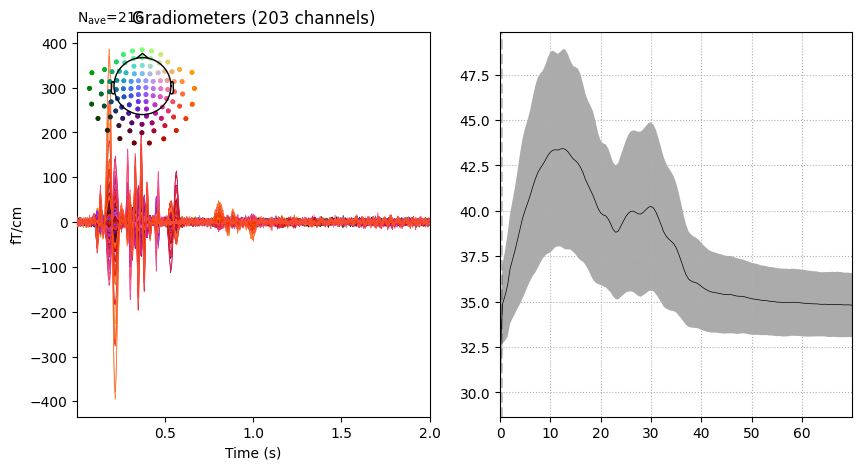

In [15]:
%matplotlib inline
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
epochsoi.plot_psd(average=True, ax=ax2, fmax=70)
epochsoi.average().plot(axes=ax1)
plt.show()

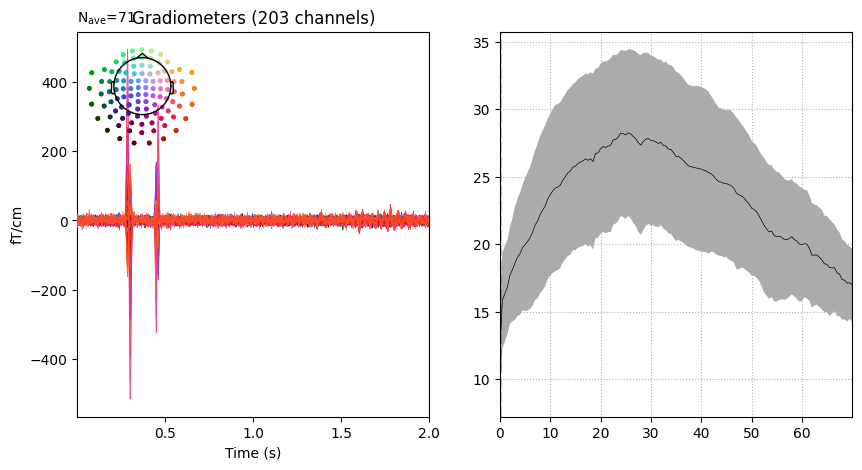

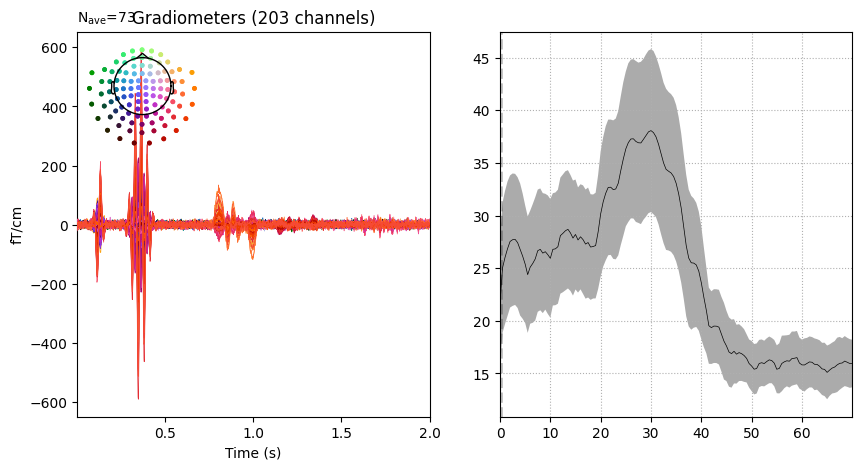

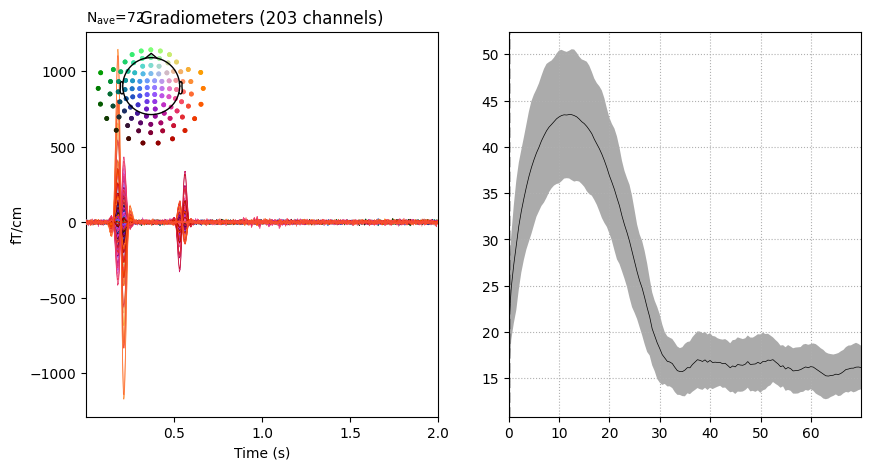

In [16]:
for evoked in evo:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    evoked.plot_psd(average=True, ax=ax2, fmax=70)
    evoked.plot(axes=ax1)
    plt.show()

In [17]:
data = epochsoi.get_data()
labels = epochsoi.events[:, 2]

In [18]:
data.shape

(216, 203, 1201)

In [19]:
plt.plot(data.mean((0,1)))

In [20]:
from deepmeg.preprocessing.transforms import one_hot_encoder

In [21]:
data.min()

-1.3072769610490251e-10

In [22]:
dataset = EpochsDataset(
    (
        epochsoi
        # data,
        # one_hot_encoder(labels)
    ),
    savepath='../simulated_n',
    transform=zscore
)

In [23]:
dataset.save('../dataset/simulated_n.pt')

In [4]:
dataset = read_epochs_dataset('../dataset/simulated_n.pt')

In [5]:
train, test = torch.utils.data.random_split(dataset, [.7, .3])

In [6]:
kwargs = dict(
    n_channels=203,
    n_latent=8,
    # n_times=601,
    n_times=1201,
    filter_size=50,
    window_size=10,
    latent_dim=10,
    pool_factor=10,
    n_outputs=3
)

In [7]:
X, y = next(iter(DataLoader(test)))
X.shape

torch.Size([1, 203, 1201])

In [8]:
# from mne.datasets import multimodal
# fname_raw = os.path.join(multimodal.data_path(), 'multimodal_raw.fif')
data_path = sample.data_path()
subjects_dir = data_path / 'subjects'
subject = 'sample'
meg_path = data_path / 'MEG' / subject
fname_raw = meg_path / 'sample_audvis_raw.fif'

info = mne.io.read_raw_fif(fname_raw).resample(600).pick_types(meg='grad').info

In [9]:
from deepmeg.models.interpretable import LFCNN

model = LFCNN(
    n_channels=203, # ~ number of channels (gradiometers)
    n_latent=8, # ~ number of latent factors
    # n_times=601, # ~ number of samples in epoch after preprocessing
    n_times=1201,
    filter_size=50, # ~ FIR filter size
    pool_factor=10, # ~ take each 10th sample from spatially filtered components
    n_outputs=3 # ~ number of output classes (number of events in epochs)
)

optimizer = torch.optim.Adam
loss = torch.nn.BCEWithLogitsLoss()
metric = torchmetrics.functional.classification.binary_accuracy

model.compile(
    optimizer,
    loss,
    metric,
    callbacks=[
        PrintingCallback(), # print ongoing training history
        EarlyStopping(patience=15, monitor='loss_val', restore_best_weights=True), # perform early stopping with restoring best weights
        L2Reg(
            [
                'unmixing_layer.weight', 'temp_conv.weight',
            ], lambdas=.01
        ) # l2 regularization for weights of spatial- and temporal filtering layers
    ]
)

/home/user/Projects/deepmeg/venv/lib/python3.10/site-packages/torch/nn/modules/conv.py:309: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at ../aten/src/ATen/native/Convolution.cpp:895.)
  return F.conv1d(input, weight, bias, self.stride,


Epoch 0:  loss_train:  0.7405   |    binary_accuracy_train:  0.4530   |    loss_val:  0.7219   |    binary_accuracy_val:  0.5333
Epoch 1:  loss_train:  0.7068   |    binary_accuracy_train:  0.5812   |    loss_val:  0.6974   |    binary_accuracy_val:  0.6095
Epoch 2:  loss_train:  0.6748   |    binary_accuracy_train:  0.7123   |    loss_val:  0.6731   |    binary_accuracy_val:  0.6952
Epoch 3:  loss_train:  0.6424   |    binary_accuracy_train:  0.8091   |    loss_val:  0.6481   |    binary_accuracy_val:  0.7429
Epoch 4:  loss_train:  0.6085   |    binary_accuracy_train:  0.8519   |    loss_val:  0.6218   |    binary_accuracy_val:  0.7619
Epoch 5:  loss_train:  0.5727   |    binary_accuracy_train:  0.8746   |    loss_val:  0.5940   |    binary_accuracy_val:  0.8095
Epoch 6:  loss_train:  0.5348   |    binary_accuracy_train:  0.8917   |    loss_val:  0.5649   |    binary_accuracy_val:  0.8095
Epoch 7:  loss_train:  0.4954   |    binary_accuracy_train:  0.8946   |    loss_val:  0.5349   | 

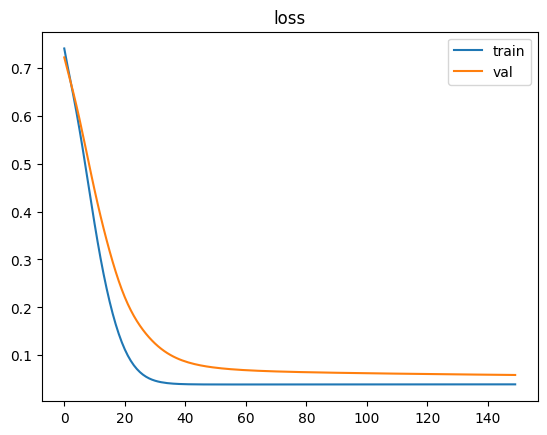

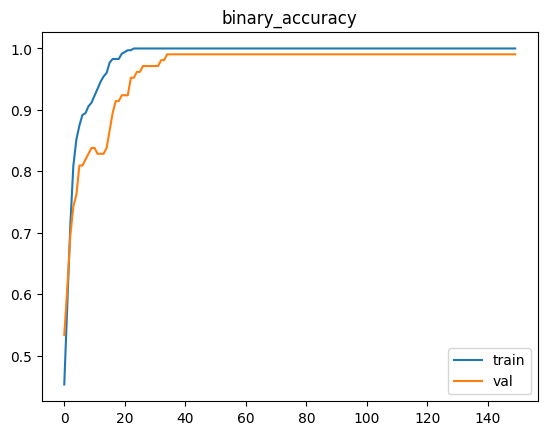

In [10]:
history = model.fit(train, n_epochs=150, batch_size=200, val_batch_size=60)
plot_metrics(history)

In [12]:
train_result = model.evaluate(train)
result = model.evaluate(test)

for measure, value in train_result.items():
    print(f'train_{measure}: {value}')

for measure, value in result.items():
    print(f'{measure}: {value}')

train_loss: 0.04348596761172468
train_binary_accuracy: 0.9979797981002114
loss: 0.042493804950605736
binary_accuracy: 1.0


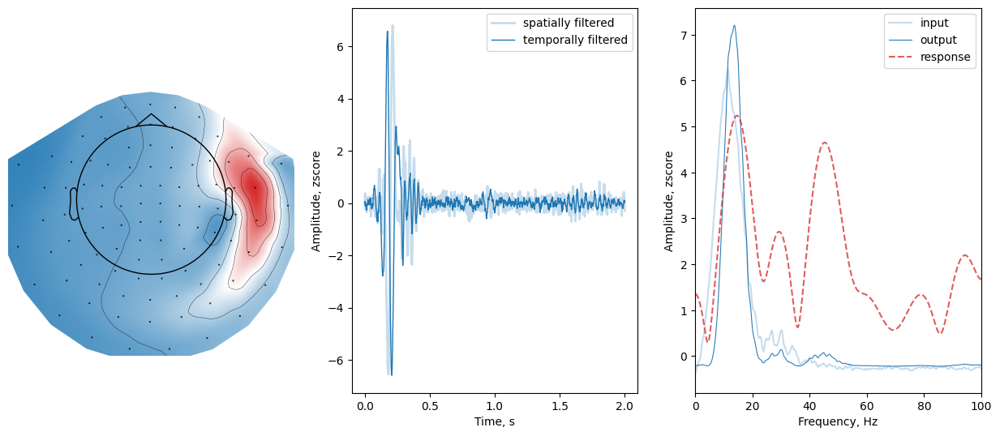

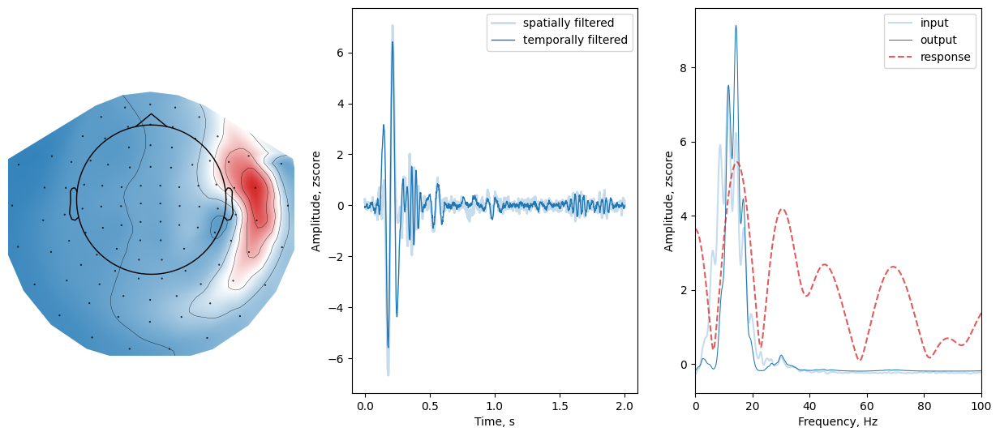

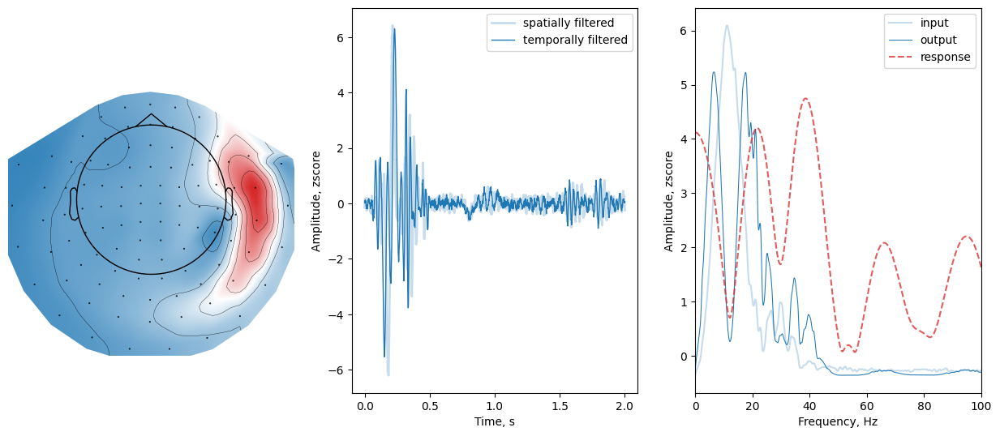

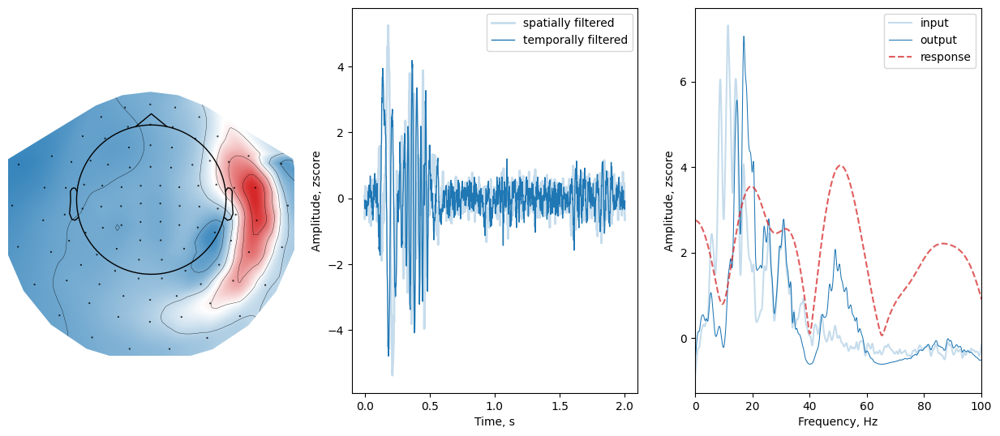

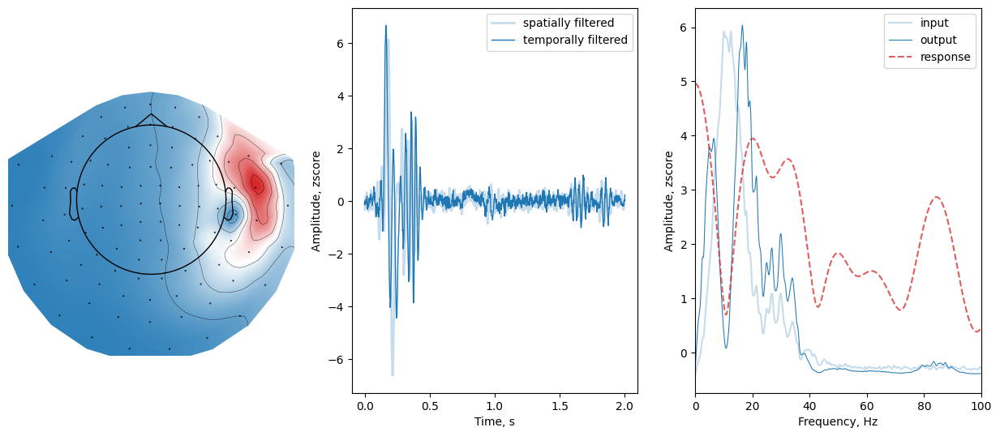

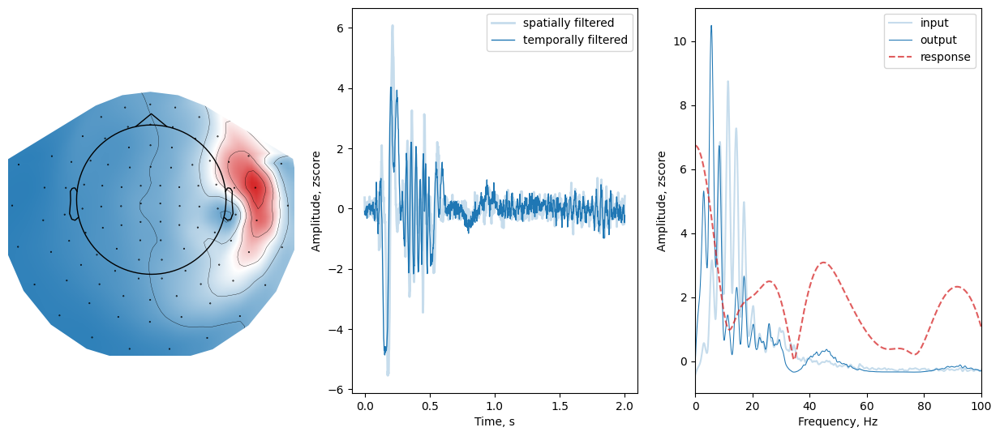

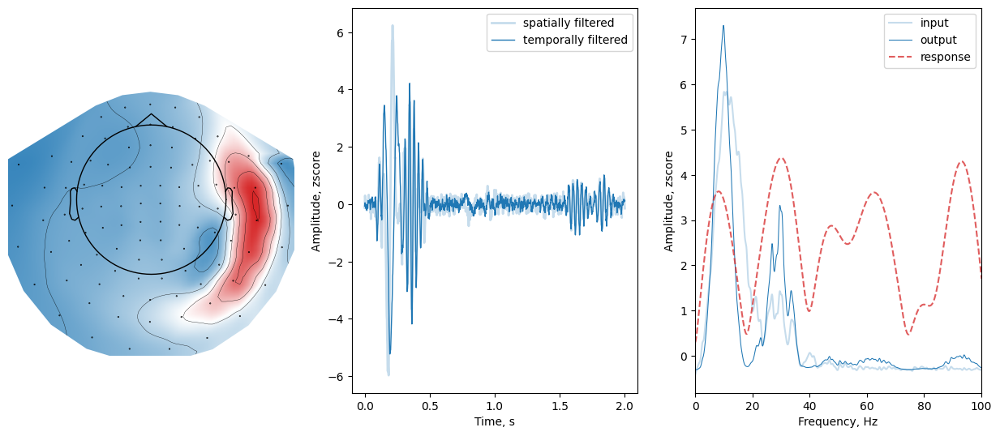

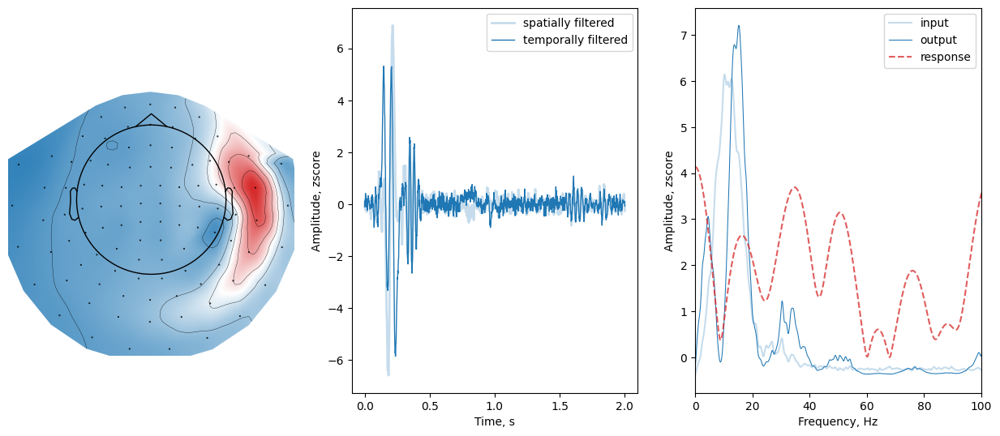

In [13]:
from deepmeg.interpreters import LFCNNInterpreter

interpreter = LFCNNInterpreter(model, test, info)
for branch in range(8):
    fig = interpreter.plot_branch(branch)
    plt.show()

In [29]:
from deepmeg.models.interpretable import TimeCompNet

model = TimeCompNet(
    n_channels=203, # ~ number of channels (gradiometers)
    n_latent=8, # ~ number of latent factors
    n_times=1201, # ~ number of samples in epoch after preprocessing
    filter_size=50, # ~ FIR filter size
    pool_factor=10, # ~ take each 10th sample from spatially filtered components
    n_outputs=3 # ~ number of output classes (number of events in epochs)
)

optimizer = torch.optim.Adam
loss = torch.nn.BCEWithLogitsLoss()
metric = torchmetrics.functional.classification.binary_accuracy

model.compile(
    optimizer,
    loss,
    metric,
    callbacks=[
        PrintingCallback(), # print ongoing training history
        EarlyStopping(patience=15, monitor='loss_val', restore_best_weights=True), # perform early stopping with restoring best weights
        L2Reg(
            [
                'unmixing_layer.weight', 'temp_conv.weight',
                *[f'timesel_list.{i}.0.weight' for i in range(8)],
            ], lambdas=[.01, .01, *[1e-3 for _ in range(8)]]
        ) # l2 regularization for weights of spatial- and temporal filtering layers
    ]
)

Epoch 0:  loss_train:  0.7987   |    binary_accuracy_train:  0.4160   |    loss_val:  0.6937   |    binary_accuracy_val:  0.6667
Epoch 1:  loss_train:  0.6746   |    binary_accuracy_train:  0.6667   |    loss_val:  0.6700   |    binary_accuracy_val:  0.6667
Epoch 2:  loss_train:  0.6316   |    binary_accuracy_train:  0.6667   |    loss_val:  0.6492   |    binary_accuracy_val:  0.6667
Epoch 3:  loss_train:  0.5894   |    binary_accuracy_train:  0.6667   |    loss_val:  0.6023   |    binary_accuracy_val:  0.6667
Epoch 4:  loss_train:  0.5214   |    binary_accuracy_train:  0.6667   |    loss_val:  0.5400   |    binary_accuracy_val:  0.6857
Epoch 5:  loss_train:  0.4422   |    binary_accuracy_train:  0.8120   |    loss_val:  0.4778   |    binary_accuracy_val:  0.8762
Epoch 6:  loss_train:  0.3702   |    binary_accuracy_train:  0.9772   |    loss_val:  0.4241   |    binary_accuracy_val:  0.9333
Epoch 7:  loss_train:  0.3142   |    binary_accuracy_train:  0.9972   |    loss_val:  0.3784   | 

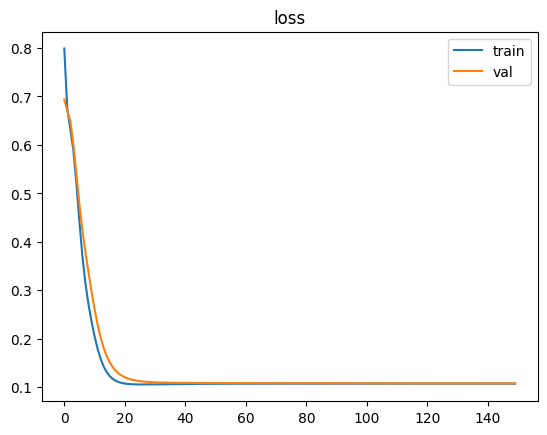

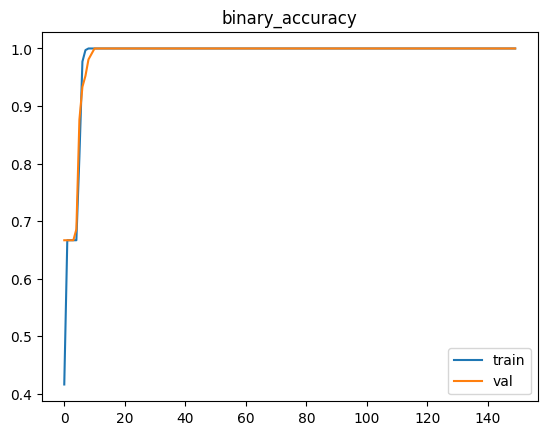

In [30]:
history = model.fit(train, n_epochs=150, batch_size=200, val_batch_size=60)
plot_metrics(history)

In [31]:
train_result = model.evaluate(train)
result = model.evaluate(test)

for measure, value in train_result.items():
    print(f'train_{measure}: {value}')

for measure, value in result.items():
    print(f'{measure}: {value}')

train_loss: 0.1076902679421685
train_binary_accuracy: 1.0
loss: 0.10804869776422327
binary_accuracy: 1.0


Estimating temporal compression weights, it will take some time
9it [17:47, 133.49s/it]                       


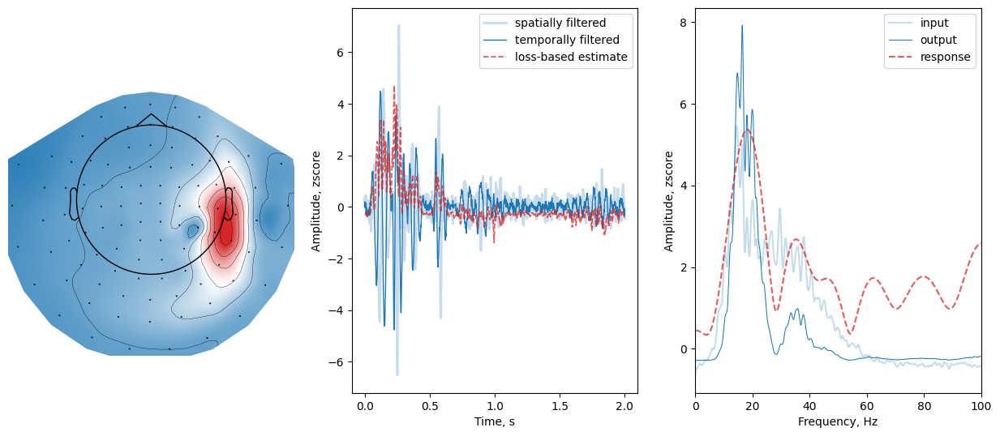

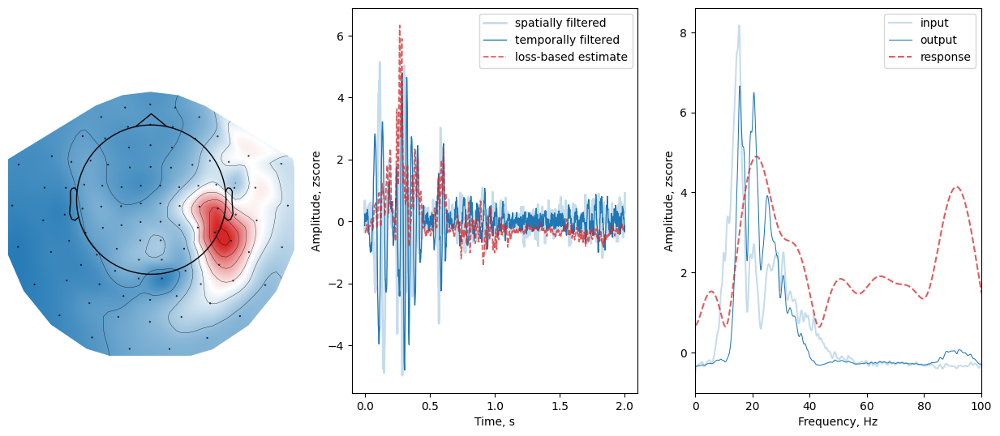

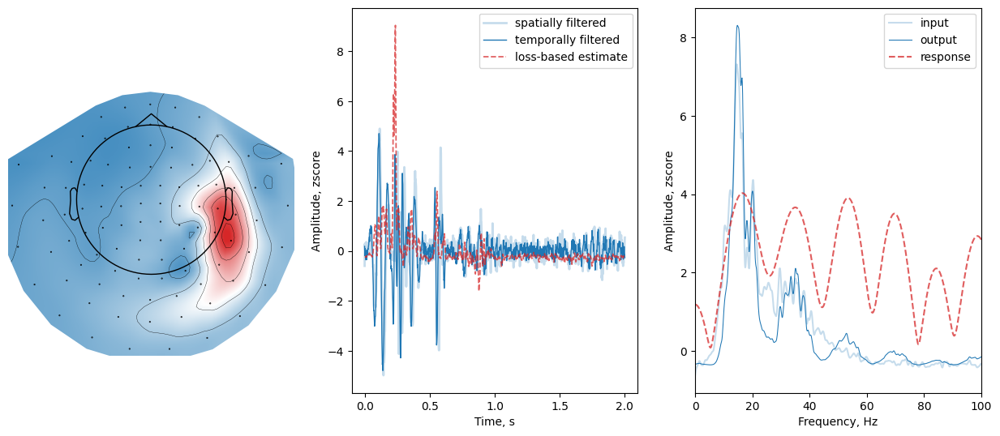

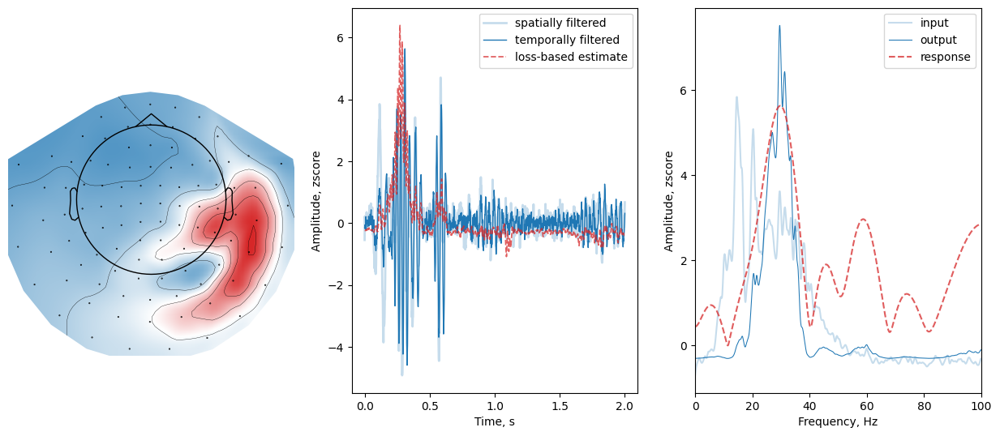

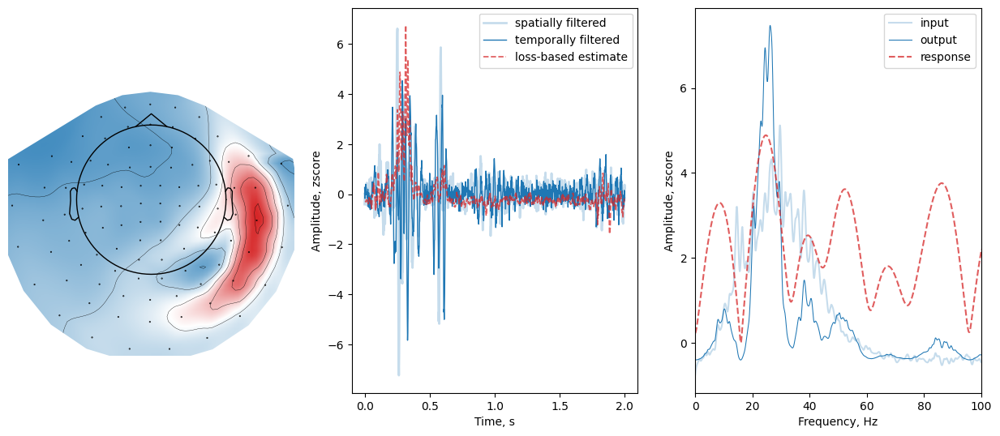

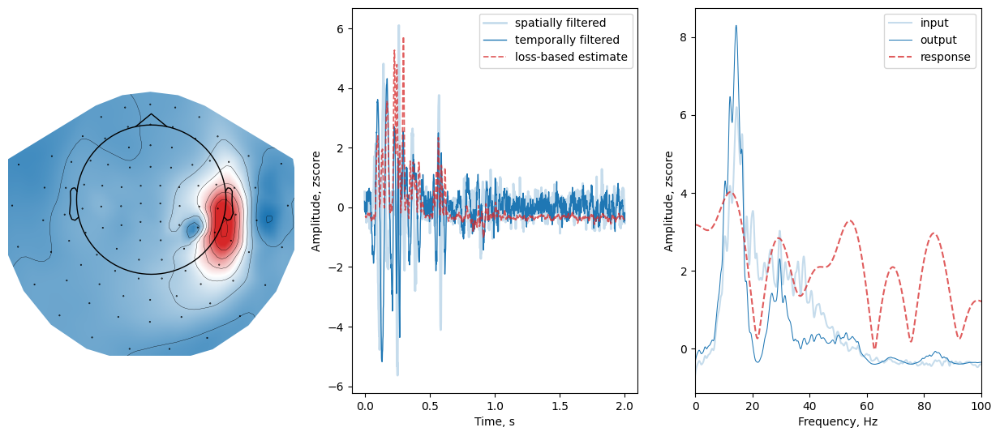

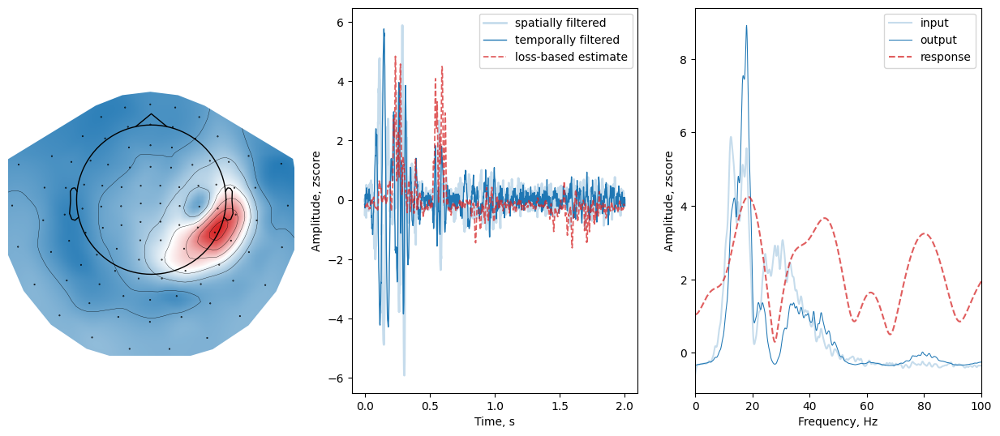

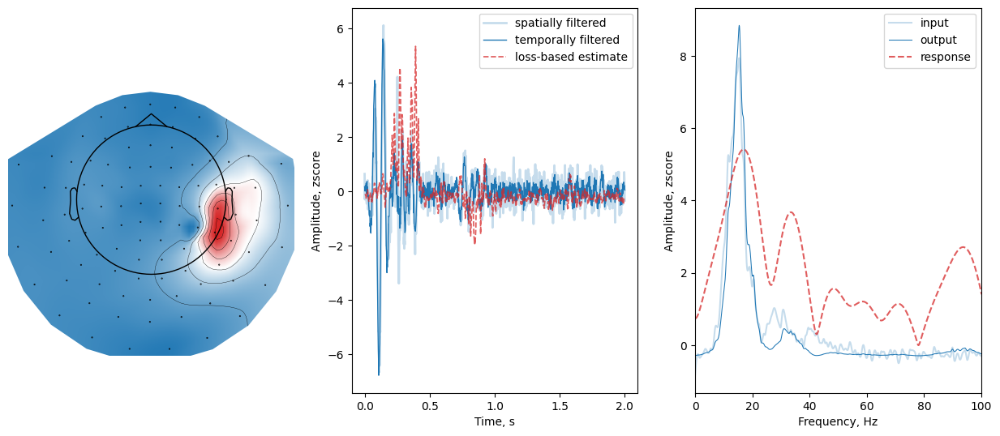

In [32]:
from deepmeg.interpreters import TimeCompNetInterpreter

interpreter = TimeCompNetInterpreter(model, test, info)
for branch in range(8):
    fig = interpreter.plot_branch(branch)
    plt.show()

In [14]:
model = SPIRIT(
    **kwargs
)

optimizer = torch.optim.Adam
loss = torch.nn.BCEWithLogitsLoss()
metric = torchmetrics.functional.classification.binary_accuracy

model.compile(
    optimizer,
    loss,
    metric,
    callbacks=[
        PrintingCallback(), # print ongoing training history
        EarlyStopping(patience=15, monitor='loss_val', restore_best_weights=True), # perform early stopping with restoring best weights
        L2Reg(
            [
                'unmixing_layer.weight', 'temp_conv.weight',
                *[f'timesel_list.{i}.0.transform.0.layer.a' for i in range(8)],
                *[f'timesel_list.{i}.0.transform.0.layer.b' for i in range(8)],
                *[f'timecomp_list.{i}.0.weight' for i in range(8)],
            ], lambdas=[
                .01, .01,
                *[.01 for _ in range(8)],
                *[.01 for _ in range(8)],
                *[.01 for _ in range(8)]
            ]
            # lambdas=.01
        ) # l2 regularization for weights of spatial- and temporal filtering layers
    ]
)

In [ ]:
model.state_dict().keys()

Epoch 0:  loss_train:  1.2087   |    binary_accuracy_train:  0.6752   |    loss_val:  1.1945   |    binary_accuracy_val:  0.6667
Epoch 1:  loss_train:  1.1807   |    binary_accuracy_train:  0.6667   |    loss_val:  1.1800   |    binary_accuracy_val:  0.6667
Epoch 2:  loss_train:  1.1760   |    binary_accuracy_train:  0.6667   |    loss_val:  1.1635   |    binary_accuracy_val:  0.6667
Epoch 3:  loss_train:  1.1691   |    binary_accuracy_train:  0.6667   |    loss_val:  1.1493   |    binary_accuracy_val:  0.6667
Epoch 4:  loss_train:  1.1584   |    binary_accuracy_train:  0.6667   |    loss_val:  1.1392   |    binary_accuracy_val:  0.6667
Epoch 5:  loss_train:  1.1442   |    binary_accuracy_train:  0.6667   |    loss_val:  1.1311   |    binary_accuracy_val:  0.6667
Epoch 6:  loss_train:  1.1256   |    binary_accuracy_train:  0.6667   |    loss_val:  1.1247   |    binary_accuracy_val:  0.6667
Epoch 7:  loss_train:  1.1055   |    binary_accuracy_train:  0.6667   |    loss_val:  1.1177   | 

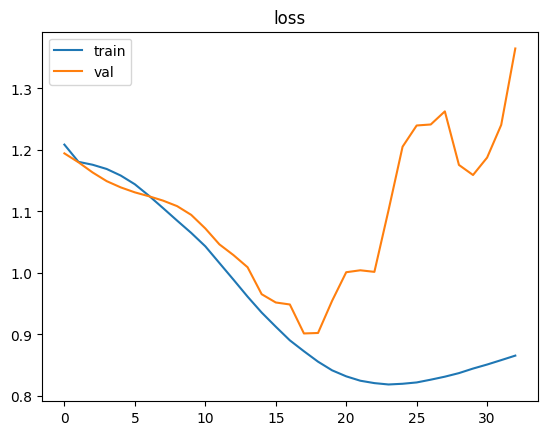

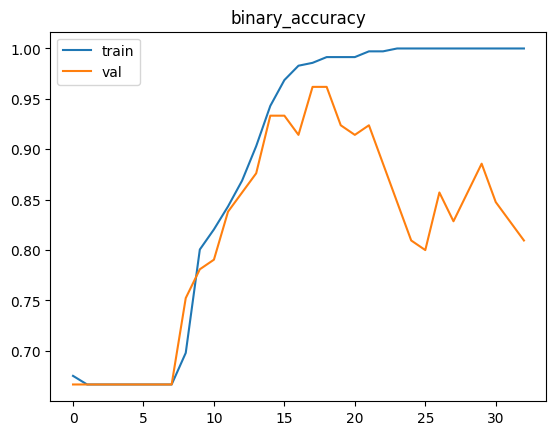

In [16]:
history = model.fit(train, n_epochs=150, batch_size=200, val_batch_size=60)
plot_metrics(history)

In [17]:
train_result = model.evaluate(train)
result = model.evaluate(test)

for measure, value in train_result.items():
    print(f'train_{measure}: {value}')

for measure, value in result.items():
    print(f'{measure}: {value}')

train_loss: 0.8818737972866405
train_binary_accuracy: 0.9777777791023254
loss: 0.9248141646385193
binary_accuracy: 0.9469696879386902


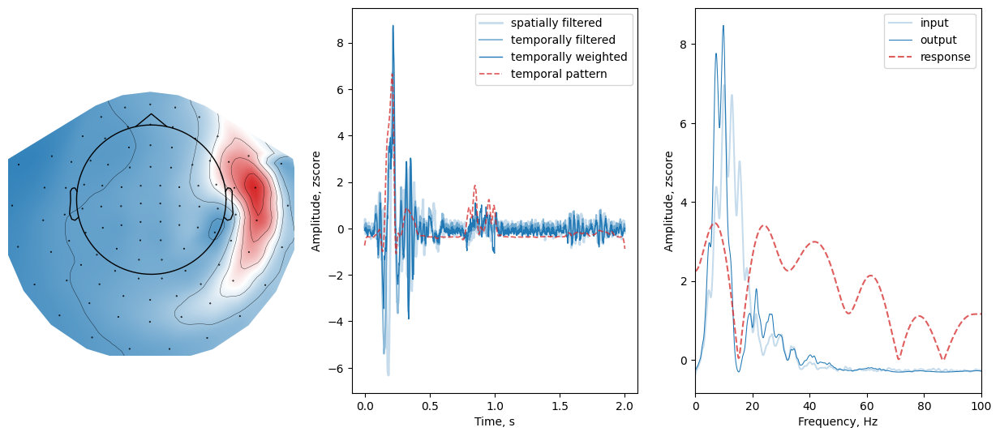

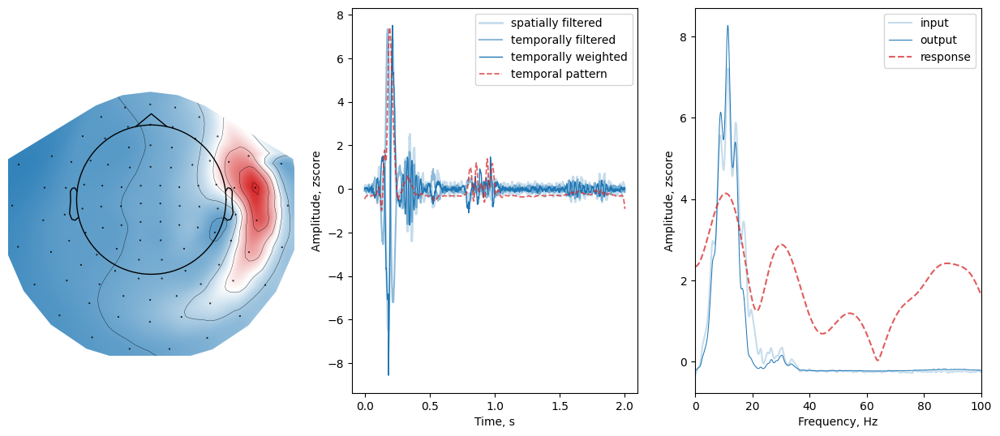

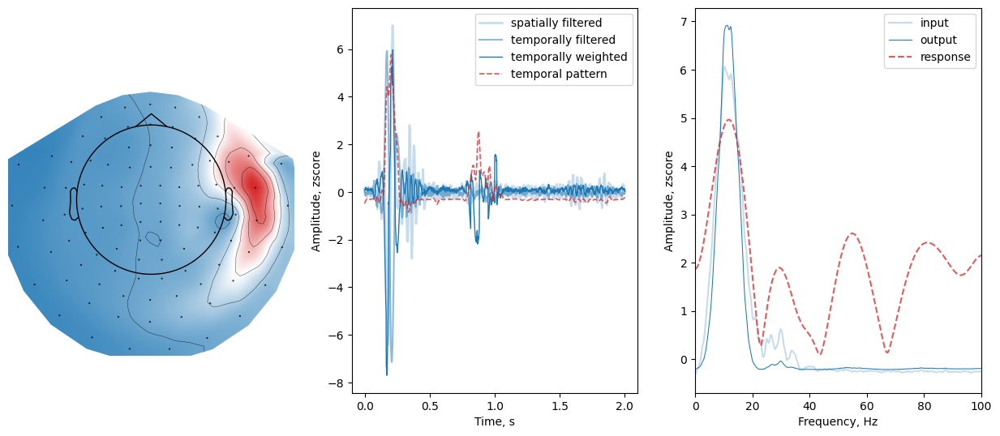

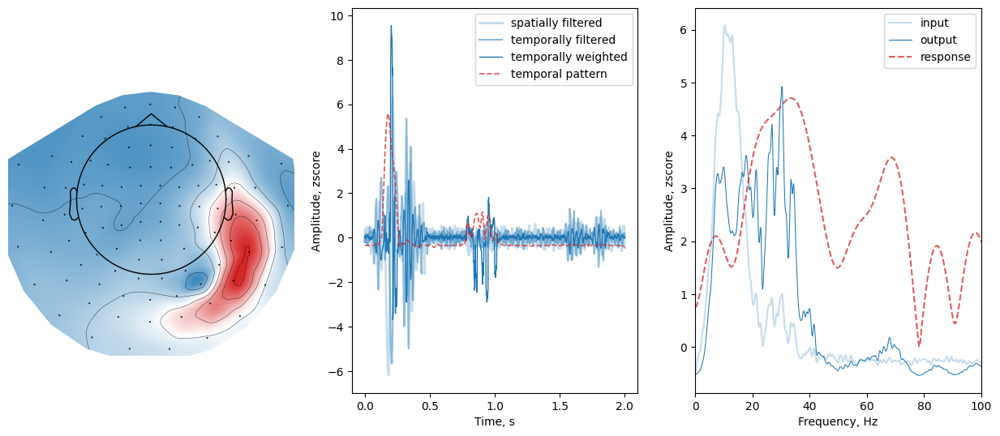

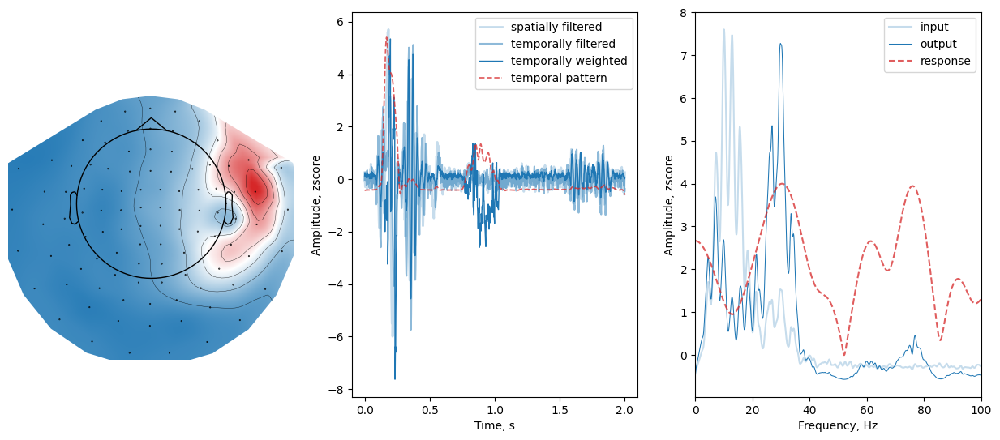

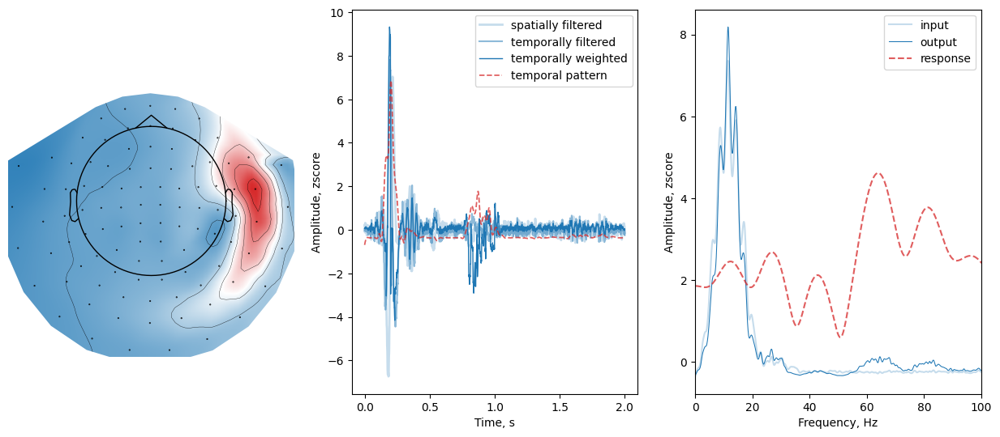

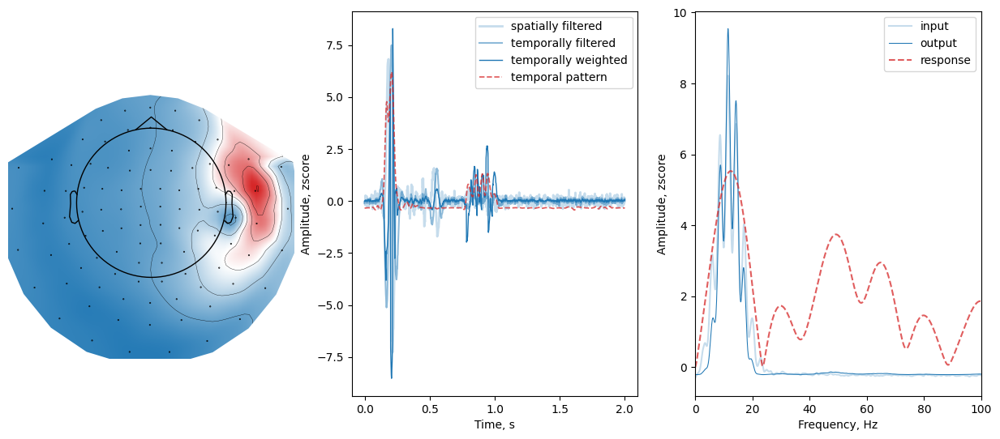

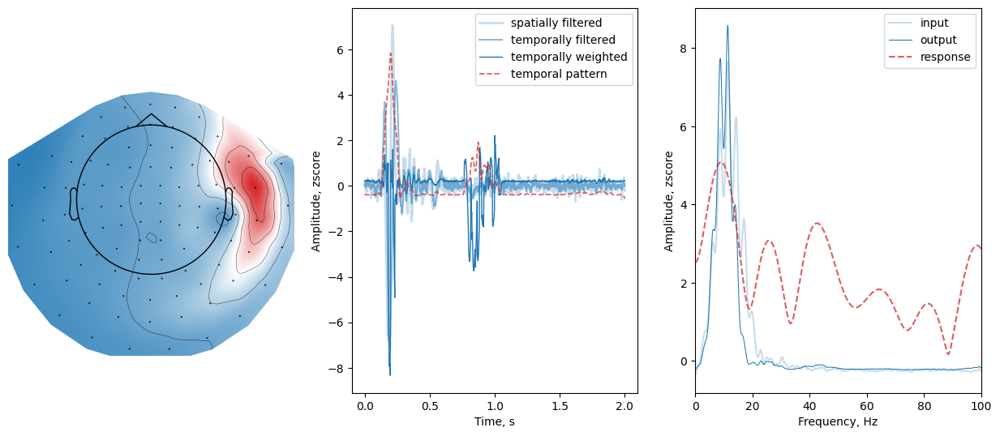

In [18]:
interpreter = SPIRITInterpreter(model, test, info)
for branch in range(8):
    fig = interpreter.plot_branch(branch)
    plt.show()